In [1]:
import pandas as pd
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('credit card.csv')

In [3]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [4]:
df.shape

(30000, 25)

In [5]:
df.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [7]:
df = df.rename(columns={'default.payment.next.month':'Payment'})

In [8]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Payment
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [9]:
x = df.drop(['ID','Payment'],axis=1)

In [10]:
y = df[['Payment']]

In [11]:
y.value_counts()

Payment
0          23364
1           6636
dtype: int64

In [12]:
23364 / (23364 + 6636)

0.7788

# Demension Reduction

In [13]:
from sklearn.ensemble import ExtraTreesClassifier

In [14]:
extr = ExtraTreesClassifier()

In [15]:
extr.fit(x,y)

ExtraTreesClassifier()

# IG from Decision Tree

In [16]:
extr.feature_importances_

array([0.06539384, 0.01159875, 0.03168632, 0.02255337, 0.06655184,
       0.09552312, 0.0469411 , 0.03743265, 0.03161792, 0.02830325,
       0.02890435, 0.05013526, 0.04670261, 0.04479012, 0.04459568,
       0.04360549, 0.04476864, 0.04432659, 0.04271273, 0.04202024,
       0.04084999, 0.04254181, 0.04644433])

In [17]:
feature_importance = extr.feature_importances_

In [18]:
feature_importance

array([0.06539384, 0.01159875, 0.03168632, 0.02255337, 0.06655184,
       0.09552312, 0.0469411 , 0.03743265, 0.03161792, 0.02830325,
       0.02890435, 0.05013526, 0.04670261, 0.04479012, 0.04459568,
       0.04360549, 0.04476864, 0.04432659, 0.04271273, 0.04202024,
       0.04084999, 0.04254181, 0.04644433])

In [19]:
imp = pd.DataFrame(feature_importance,columns=['Gain_score'])

In [20]:
imp.head()

,Gain_score
0,0.065394
1,0.011599
2,0.031686
3,0.022553
4,0.066552


In [21]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [22]:
cols = pd.DataFrame(x.columns,columns=['Feature_Names'])

In [23]:
cols.head()

,Feature_Names
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE


# Two Value Concat

In [24]:
gains = pd.concat([cols,imp],axis=1)

In [25]:
gains.head()

,Feature_Names,Gain_score
0,LIMIT_BAL,0.065394
1,SEX,0.011599
2,EDUCATION,0.031686
3,MARRIAGE,0.022553
4,AGE,0.066552


In [26]:
gains.nlargest(17,"Gain_score")

,Feature_Names,Gain_score
5,PAY_0,0.095523
4,AGE,0.066552
0,LIMIT_BAL,0.065394
11,BILL_AMT1,0.050135
6,PAY_2,0.046941
12,BILL_AMT2,0.046703
22,PAY_AMT6,0.046444
13,BILL_AMT3,0.044790
16,BILL_AMT6,0.044769
14,BILL_AMT4,0.044596


In [27]:
#gains.nlargest(21,'Gain_score')

In [28]:
gains.nsmallest(8,'Gain_score')

,Feature_Names,Gain_score
1,SEX,0.011599
3,MARRIAGE,0.022553
9,PAY_5,0.028303
10,PAY_6,0.028904
8,PAY_4,0.031618
2,EDUCATION,0.031686
7,PAY_3,0.037433
20,PAY_AMT4,0.040850


In [29]:
newx = gains.nlargest(18,'Gain_score')

In [30]:
newx.head()

,Feature_Names,Gain_score
5,PAY_0,0.095523
4,AGE,0.066552
0,LIMIT_BAL,0.065394
11,BILL_AMT1,0.050135
6,PAY_2,0.046941


<AxesSubplot:>

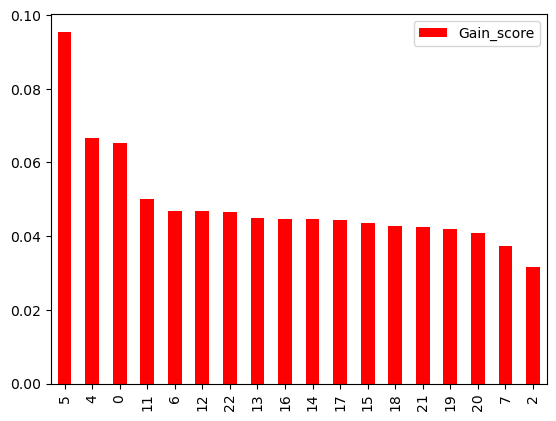

In [31]:
newx.plot(kind='bar',color=['red'])

<AxesSubplot:>

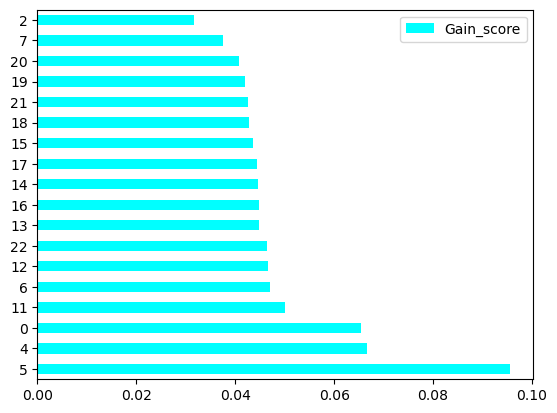

In [32]:
newx.plot(kind='barh',color=["cyan"])

<AxesSubplot:>

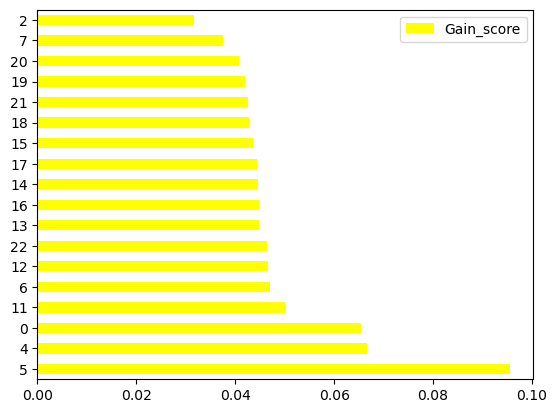

In [33]:
newx.plot(kind='barh',color=['yellow'])

<AxesSubplot:>

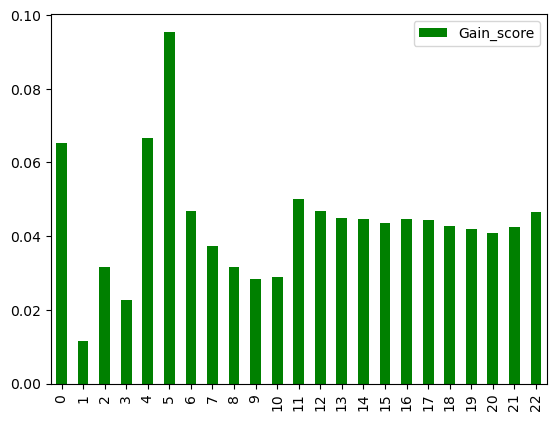

In [34]:
gains.plot(kind='bar',color='green')

In [35]:
x.shape

(30000, 23)

In [36]:
import matplotlib.pyplot as plt

In [37]:
features = pd.Series(extr.feature_importances_)

In [38]:
features.head()

0    0.065394
1    0.011599
2    0.031686
3    0.022553
4    0.066552
dtype: float64

In [39]:
features = pd.Series(extr.feature_importances_,index=x.columns)

In [40]:
features.head()

LIMIT_BAL    0.065394
SEX          0.011599
EDUCATION    0.031686
MARRIAGE     0.022553
AGE          0.066552
dtype: float64

<AxesSubplot:>

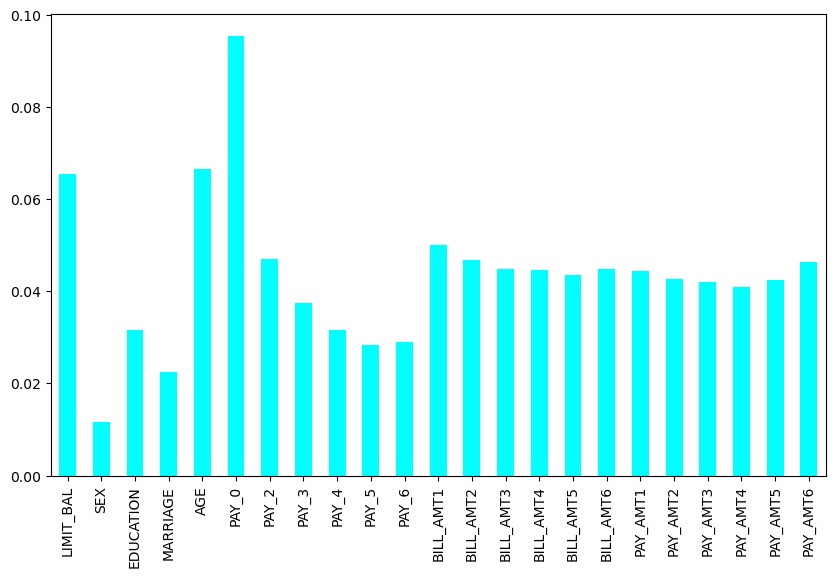

In [41]:
plt.figure(figsize=(10,6))
features.nlargest(20)
features.plot(kind='bar',color='cyan')

Text(0.5, 1.0, 'This is Principal Component Analysis (PCA)')

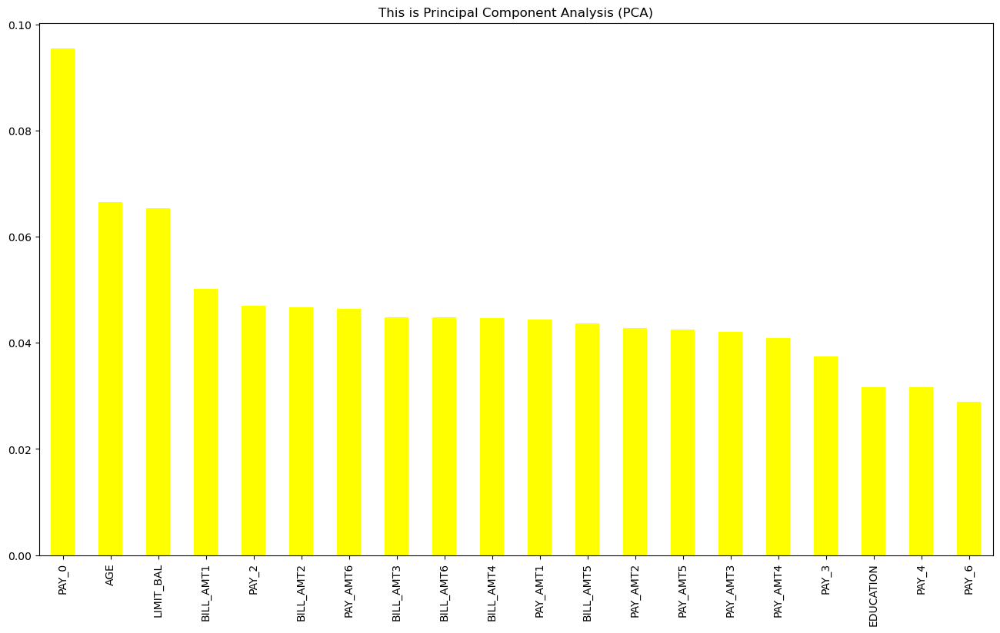

In [42]:
    plt.figure(figsize=(16,9))
    features.nlargest(20).plot(kind='bar',color='yellow')
    plt.title('This is Principal Component Analysis (PCA)')

<AxesSubplot:>

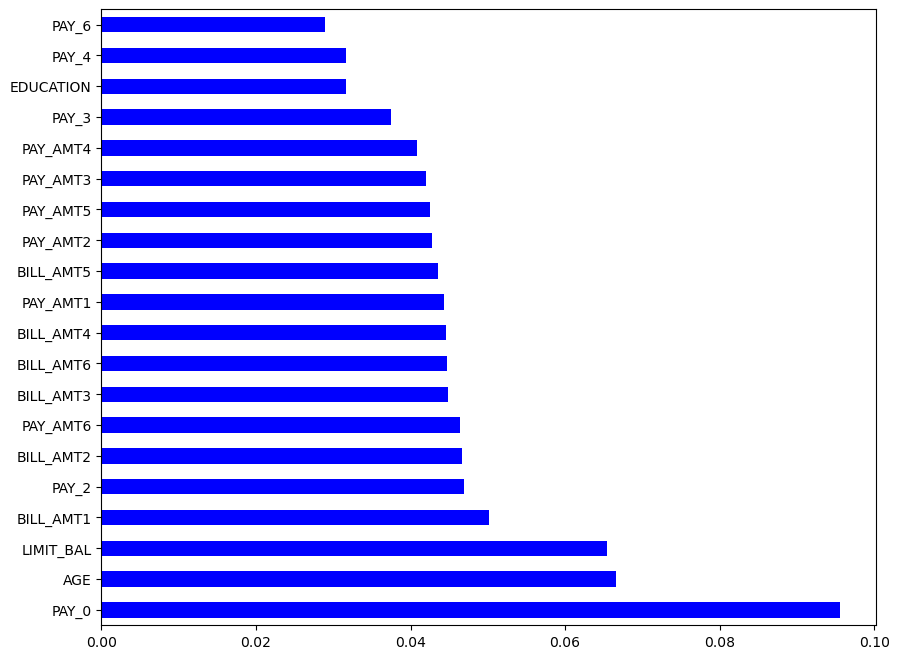

In [43]:
plt.figure(figsize=(10,8))
features.nlargest(20).plot(kind='barh',color='blue')

In [44]:
x.corr()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
LIMIT_BAL,1.000000,0.024755,-0.219161,-0.108139,0.144713,-0.271214,-0.296382,-0.286123,-0.267460,-0.249411,...,0.283236,0.293988,0.295562,0.290389,0.195236,0.178408,0.210167,0.203242,0.217202,0.219595
SEX,0.024755,1.000000,0.014232,-0.031389,-0.090874,-0.057643,-0.070771,-0.066096,-0.060173,-0.055064,...,-0.024563,-0.021880,-0.017005,-0.016733,-0.000242,-0.001391,-0.008597,-0.002229,-0.001667,-0.002766
EDUCATION,-0.219161,0.014232,1.000000,-0.143464,0.175061,0.105364,0.121566,0.114025,0.108793,0.097520,...,0.013002,-0.000451,-0.007567,-0.009099,-0.037456,-0.030038,-0.039943,-0.038218,-0.040358,-0.037200
MARRIAGE,-0.108139,-0.031389,-0.143464,1.000000,-0.414170,0.019917,0.024199,0.032688,0.033122,0.035629,...,-0.024909,-0.023344,-0.025393,-0.021207,-0.005979,-0.008093,-0.003541,-0.012659,-0.001205,-0.006641
AGE,0.144713,-0.090874,0.175061,-0.414170,1.000000,-0.039447,-0.050148,-0.053048,-0.049722,-0.053826,...,0.053710,0.051353,0.049345,0.047613,0.026147,0.021785,0.029247,0.021379,0.022850,0.019478
PAY_0,-0.271214,-0.057643,0.105364,0.019917,-0.039447,1.000000,0.672164,0.574245,0.538841,0.509426,...,0.179785,0.179125,0.180635,0.176980,-0.079269,-0.070101,-0.070561,-0.064005,-0.058190,-0.058673
PAY_2,-0.296382,-0.070771,0.121566,0.024199,-0.050148,0.672164,1.000000,0.766552,0.662067,0.622780,...,0.224146,0.222237,0.221348,0.219403,-0.080701,-0.058990,-0.055901,-0.046858,-0.037093,-0.036500
PAY_3,-0.286123,-0.066096,0.114025,0.032688,-0.053048,0.574245,0.766552,1.000000,0.777359,0.686775,...,0.227494,0.227202,0.225145,0.222327,0.001295,-0.066793,-0.053311,-0.046067,-0.035863,-0.035861
PAY_4,-0.267460,-0.060173,0.108793,0.033122,-0.049722,0.538841,0.662067,0.777359,1.000000,0.819835,...,0.244983,0.245917,0.242902,0.239154,-0.009362,-0.001944,-0.069235,-0.043461,-0.033590,-0.026565
PAY_5,-0.249411,-0.055064,0.097520,0.035629,-0.053826,0.509426,0.622780,0.686775,0.819835,1.000000,...,0.243335,0.271915,0.269783,0.262509,-0.006089,-0.003191,0.009062,-0.058299,-0.033337,-0.023027


In [45]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [46]:
feature_name = x.columns

<AxesSubplot:>

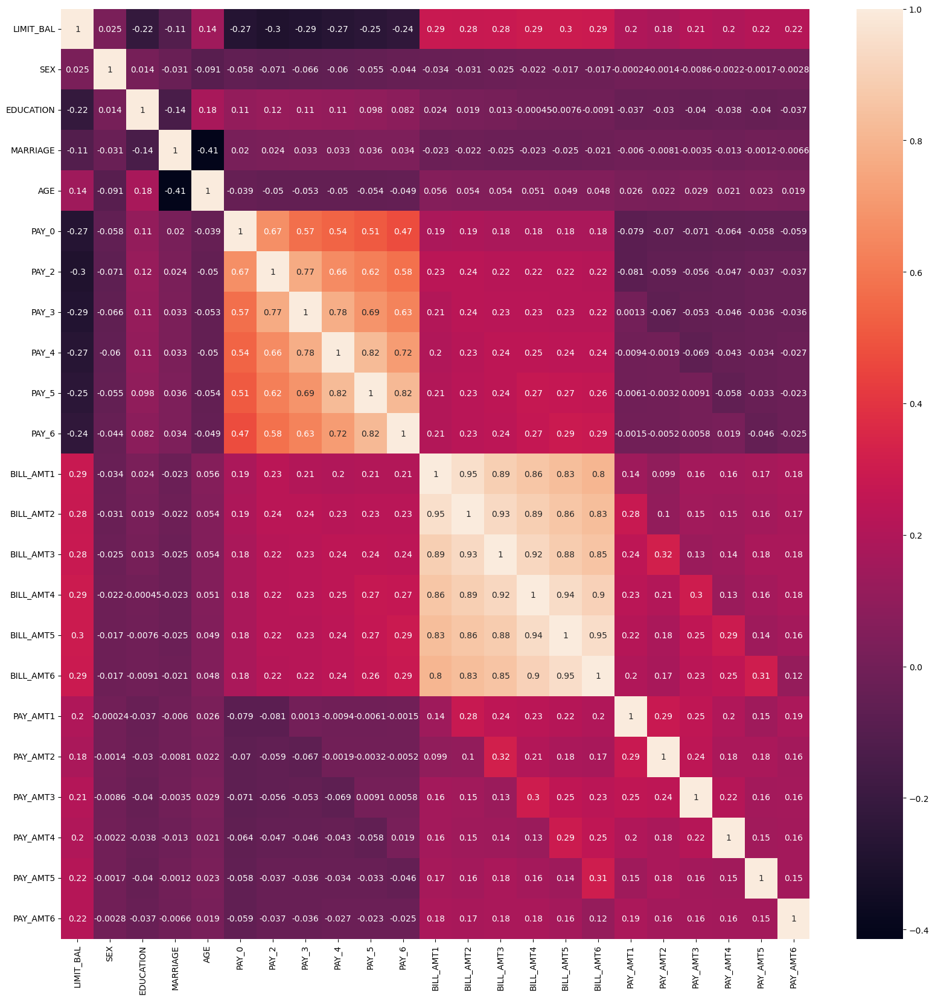

In [47]:
colnme = x.corr().index
plt.figure(figsize=(20,20))
sns.heatmap(df[colnme].corr(),annot=True)

In [48]:
feature_name = x.columns

<AxesSubplot:>

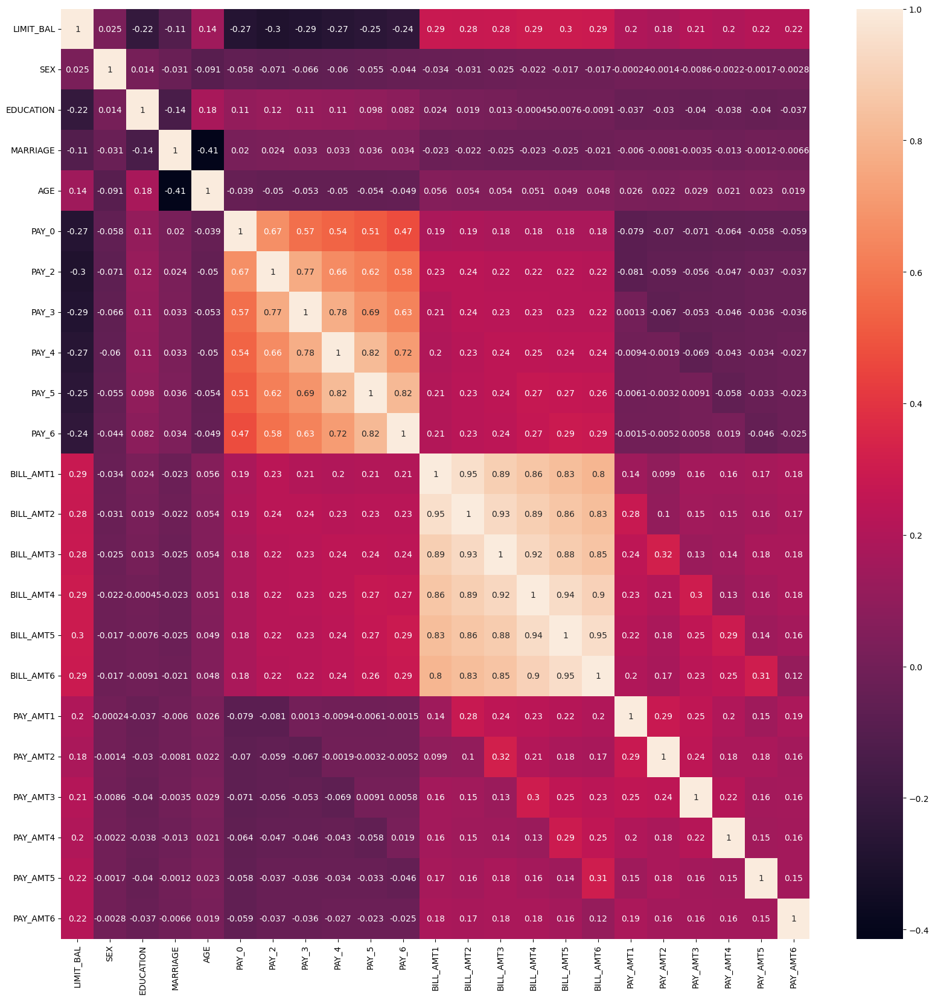

In [49]:
colnme = x.corr().index
plt.figure(figsize=(20,20))
sns.heatmap(df[colnme].corr(),annot=True)

# Select K BEST

In [50]:
df = pd.read_csv('credit card.csv')

In [51]:
df = df.rename(columns={'default.payment.next.month':'Payment'})

In [52]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Payment
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [53]:
x = df.drop(['ID','Payment'],axis=1)

In [54]:
y = df['Payment']

In [55]:
x.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0


In [56]:
from sklearn.feature_selection import SelectKBest,f_classif,chi2,f_regression

In [57]:
model2 = SelectKBest(score_func=f_classif)

In [58]:
feature_score = model2.fit(x,y)

In [59]:
feature_score.scores_

array([7.24068539e+02, 4.79788543e+01, 2.35471118e+01, 1.77812714e+01,
       5.78855582e+00, 3.53771497e+03, 2.23916914e+03, 1.75746644e+03,
       1.47684597e+03, 1.30459118e+03, 1.08540249e+03, 1.15805315e+01,
       6.04423789e+00, 5.94438771e+00, 3.09474518e+00, 1.37108740e+00,
       8.65820292e-01, 1.60403810e+02, 1.03291524e+02, 9.52180109e+01,
       9.71880005e+01, 9.14298008e+01, 8.50890453e+01])

In [60]:
cols = pd.DataFrame(feature_score.scores_,columns=['Feature_Score'])

In [61]:
cols.head()

,Feature_Score
0,724.068539
1,47.978854
2,23.547112
3,17.781271
4,5.788556


In [62]:
x.columns

Index(['LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0', 'PAY_2',
       'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [63]:
col2 = pd.DataFrame(x.columns,columns=['Feature_Name'])

In [64]:
col2.head()

,Feature_Name
0,LIMIT_BAL
1,SEX
2,EDUCATION
3,MARRIAGE
4,AGE


In [65]:
score = pd.concat([col2,cols],axis=1)

In [66]:
score.head()

,Feature_Name,Feature_Score
0,LIMIT_BAL,724.068539
1,SEX,47.978854
2,EDUCATION,23.547112
3,MARRIAGE,17.781271
4,AGE,5.788556


In [67]:
score.nlargest(18,'Feature_Score')

,Feature_Name,Feature_Score
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176
10,PAY_6,1085.402485
0,LIMIT_BAL,724.068539
17,PAY_AMT1,160.403810
18,PAY_AMT2,103.291524
20,PAY_AMT4,97.188000


In [68]:
df3 = df.drop(['LIMIT_BAL','EDUCATION'],axis=1)

In [69]:
df3.head()

,ID,SEX,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Payment
0,1,2,1,24,2,2,-1,-1,-2,-2,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,2,2,26,-1,2,0,0,0,2,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,2,2,34,0,0,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,2,1,37,0,0,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,1,1,57,-1,0,-1,0,0,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [70]:
df3.to_csv('new_csv')

# Now two value concat

In [71]:
score = pd.concat([col2,cols],axis=1)

In [72]:
score

,Feature_Name,Feature_Score
0,LIMIT_BAL,724.068539
1,SEX,47.978854
2,EDUCATION,23.547112
3,MARRIAGE,17.781271
4,AGE,5.788556
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176


In [73]:
newx = score.nlargest(15,'Feature_Score')

In [74]:
newx

,Feature_Name,Feature_Score
5,PAY_0,3537.714970
6,PAY_2,2239.169136
7,PAY_3,1757.466444
8,PAY_4,1476.845967
9,PAY_5,1304.591176
10,PAY_6,1085.402485
0,LIMIT_BAL,724.068539
17,PAY_AMT1,160.403810
18,PAY_AMT2,103.291524
20,PAY_AMT4,97.188000


In [75]:
import pandas as pd

In [76]:
df = pd.read_csv('credit card.csv')

In [77]:
df = df.rename(columns={'default.payment.next.month':'Payment'})

In [78]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Payment
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


In [79]:
x = df.drop(['ID','Payment'],axis=1)

In [80]:
y = df['Payment']

In [81]:
x

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,20000.0,2,2,1,24,2,2,-1,-1,-2,...,689.0,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0
1,120000.0,2,2,2,26,-1,2,0,0,0,...,2682.0,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0
2,90000.0,2,2,2,34,0,0,0,0,0,...,13559.0,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0
3,50000.0,2,2,1,37,0,0,0,0,0,...,49291.0,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0
4,50000.0,1,2,1,57,-1,0,-1,0,0,...,35835.0,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29995,220000.0,1,3,1,39,0,0,0,0,0,...,208365.0,88004.0,31237.0,15980.0,8500.0,20000.0,5003.0,3047.0,5000.0,1000.0
29996,150000.0,1,3,2,43,-1,-1,-1,-1,0,...,3502.0,8979.0,5190.0,0.0,1837.0,3526.0,8998.0,129.0,0.0,0.0
29997,30000.0,1,2,2,37,4,3,2,-1,0,...,2758.0,20878.0,20582.0,19357.0,0.0,0.0,22000.0,4200.0,2000.0,3100.0
29998,80000.0,1,3,1,41,1,-1,0,0,0,...,76304.0,52774.0,11855.0,48944.0,85900.0,3409.0,1178.0,1926.0,52964.0,1804.0


In [82]:
from sklearn.preprocessing import MinMaxScaler

In [83]:
mnx = MinMaxScaler()

In [84]:
scaled_x = mnx.fit_transform(x)

In [85]:
scaled_x.shape

(30000, 23)

In [86]:
scaled_x

array([[0.01010101, 1.        , 0.33333333, ..., 0.        , 0.        ,
        0.        ],
       [0.11111111, 1.        , 0.33333333, ..., 0.00161031, 0.        ,
        0.00378311],
       [0.08080808, 1.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00945777],
       ...,
       [0.02020202, 0.        , 0.33333333, ..., 0.00676329, 0.00468901,
        0.00586382],
       [0.07070707, 0.        , 0.5       , ..., 0.00310145, 0.12417444,
        0.00341236],
       [0.04040404, 0.        , 0.33333333, ..., 0.00161031, 0.00234451,
        0.00189155]])

# Now PCA

In [87]:
from sklearn.decomposition import PCA

In [88]:
pca = PCA(n_components=3)

In [89]:
x_pca = pca.fit_transform(scaled_x)

In [90]:
x_pca

array([[-0.40423245, -0.00800476, -0.00259674],
       [-0.39188881,  0.20922401, -0.19698761],
       [-0.39264215,  0.08409527, -0.12656656],
       ...,
       [ 0.62351265,  0.33728836, -0.08489178],
       [ 0.60374479, -0.01953155,  0.21421099],
       [ 0.60917214,  0.0099741 ,  0.23321988]])

In [91]:
feature = pd.DataFrame(x_pca,columns=['pca1','pca2','pca3'])

In [92]:
feature

,pca1,pca2,pca3
0,-0.404232,-0.008005,-0.002597
1,-0.391889,0.209224,-0.196988
2,-0.392642,0.084095,-0.126567
3,-0.394038,0.068885,0.154030
4,0.610813,-0.089679,0.334445
...,...,...,...
29995,0.605245,0.027127,0.231678
29996,0.601275,-0.132858,-0.028314
29997,0.623513,0.337288,-0.084892
29998,0.603745,-0.019532,0.214211


In [93]:
import plotly.express as pl
pl.scatter_3d(feature, x='pca1',y='pca2',z='pca3', color='pca1')

In [94]:
from sklearn.model_selection import train_test_split as tts

In [95]:
xtrain,xtest,ytrain,ytest = tts(feature,y,test_size=.30,random_state=1)

In [96]:
xtrain.head()

,pca1,pca2,pca3
4936,0.588201,-0.220413,-0.321038
4788,0.616076,0.062374,0.319937
8447,-0.396698,0.103833,-0.210450
4535,0.588418,-0.368499,-0.139352
27563,0.619138,0.027233,0.115131


In [97]:
from sklearn.linear_model import LogisticRegression

In [98]:
clf = LogisticRegression()

In [99]:
clf.fit(xtrain,ytrain)

LogisticRegression()

In [100]:
clf.score(xtest,ytest)

0.7962222222222223

In [101]:
clf.score(xtrain,ytrain)

0.7938571428571428

# Before

In [102]:
xtrain1,xtest2, ytrain1,ytest1=tts(x,y,test_size=.30, random_state=1)

In [103]:
xtrain1.head()

,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
4936,20000.0,1,1,2,24,-1,-1,-1,-1,-1,...,390.0,780.0,0.0,0.0,390.0,390.0,780.0,0.0,0.0,0.0
4788,120000.0,1,2,1,52,2,0,0,0,0,...,105262.0,46605.0,45590.0,46204.0,4449.0,2731.0,3000.0,5000.0,3000.0,3000.0
8447,70000.0,2,2,2,26,0,0,0,0,0,...,26103.0,28342.0,24894.0,25272.0,3003.0,5106.0,4026.0,755.0,1029.0,5303.0
4535,230000.0,1,2,2,37,1,-2,-2,-2,-2,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27563,130000.0,1,2,2,56,0,0,0,0,0,...,111780.0,116357.0,96936.0,98173.0,4000.0,5000.0,8000.0,4000.0,4000.0,5000.0


In [104]:
clf.fit(xtarin1,ytarin1)

NameError: name 'xtarin1' is not defined

In [ ]:
clf.score(xtest2,ytest2)

In [ ]:
clf.score(xtrain1,ytrain1)